Title, group members
TODO Find out what years the dataset is from (if possible)

Intro

Describe data
For this project, we will be using the pitstops dataset as well as the results dataset. For the pitstops dataset, each row represents a driver and the corresponding information regarding their pitstops such as during what time in the race as well as how long they took a pitstop. For the results dataset, each row represents a driver and the corresponding information regarding the results of their races. There are 9634 observations in the pitstop dataset and 25840 observations in the results dataset. 

In [14]:
#describe data code
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 
pitstop = pd.read_csv("data_raw/pit_stops.csv")
results = pd.read_csv("data_raw/results.csv")
pitstop_rows = len(pitstop)
results_rows = len(results)
print(pitstop_rows)
print(results_rows)
pitstop


9634
25840


,raceId,driverId,stop,lap,time,duration,milliseconds
0,841,153,1,1,17:05:23,26.898,26898
1,841,30,1,1,17:05:52,25.021,25021
2,841,17,1,11,17:20:48,23.426,23426
3,841,4,1,12,17:22:34,23.251,23251
4,841,13,1,13,17:24:10,23.842,23842
...,...,...,...,...,...,...,...
9629,1096,849,2,38,18:02:50,25.174,25174
9630,1096,840,2,40,18:04:44,21.802,21802
9631,1096,839,2,41,18:06:09,21.734,21734
9632,1096,846,2,42,18:07:36,21.559,21559


Merging

In [15]:
#merging code
merge = pd.merge(results,
                    pitstop,
                    on = ["driverId", "raceId"],
                    how = "inner")
merge


,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,...,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,stop,lap,time_y,duration,milliseconds_y
0,20779,841,20,9,1,1,1,1,1,25.0,...,44,4,1:29.844,212.488,1,1,14,17:25:17,22.603,22603
1,20779,841,20,9,1,1,1,1,1,25.0,...,44,4,1:29.844,212.488,1,2,36,17:59:17,24.036,24036
2,20780,841,1,1,3,2,2,2,2,18.0,...,41,8,1:30.314,211.382,1,1,16,17:28:24,23.227,23227
3,20780,841,1,1,3,2,2,2,2,18.0,...,41,8,1:30.314,211.382,1,2,36,17:59:29,23.199,23199
4,20781,841,808,4,10,6,3,3,3,15.0,...,55,7,1:30.064,211.969,1,1,16,17:28:39,24.535,24535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9629,25842,1096,825,210,20,16,17,17,17,0.0,...,40,20,1:31.158,208.556,11,1,28,17:46:53,22.387,22387
9630,25843,1096,1,131,44,5,18,18,18,0.0,...,42,11,1:29.788,211.738,9,1,18,17:30:48,21.270,21270
9631,25844,1096,849,3,6,20,19,19,19,0.0,...,45,14,1:30.309,210.517,130,1,15,17:26:44,22.423,22423
9632,25844,1096,849,3,6,20,19,19,19,0.0,...,45,14,1:30.309,210.517,130,2,38,18:02:50,25.174,25174


cleaning

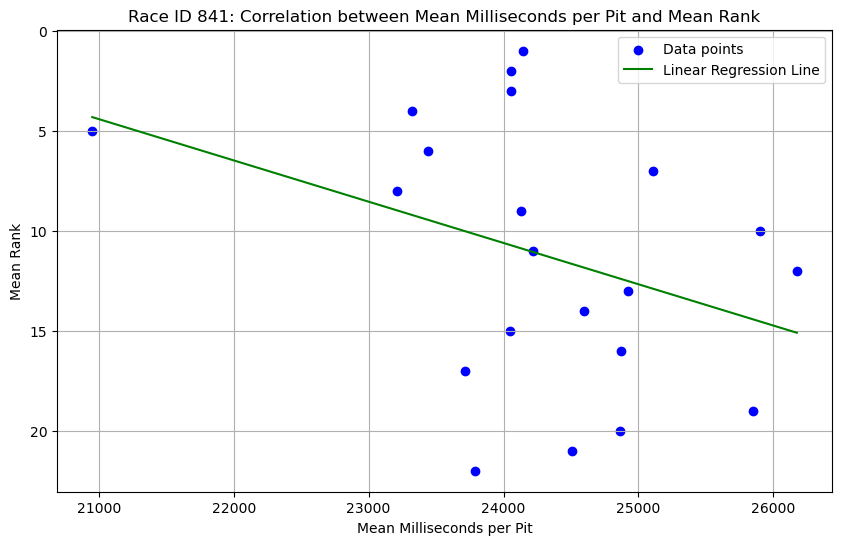

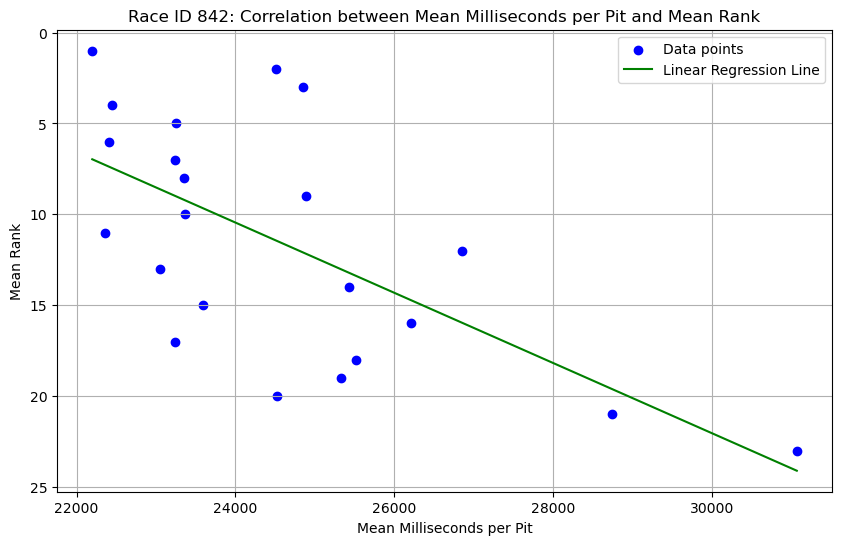

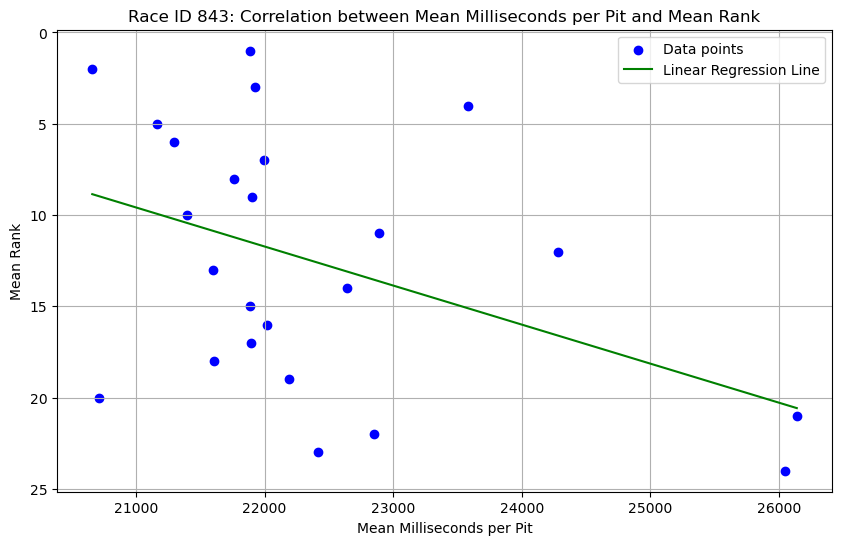

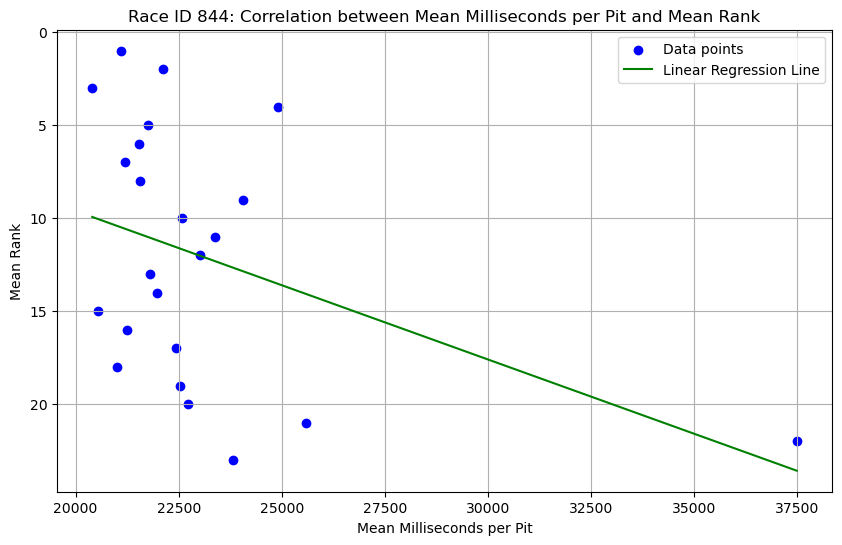

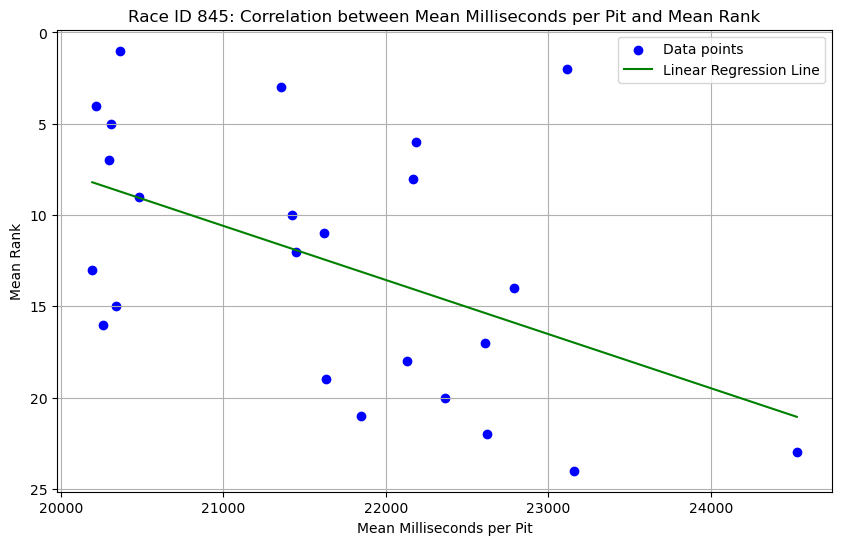

...

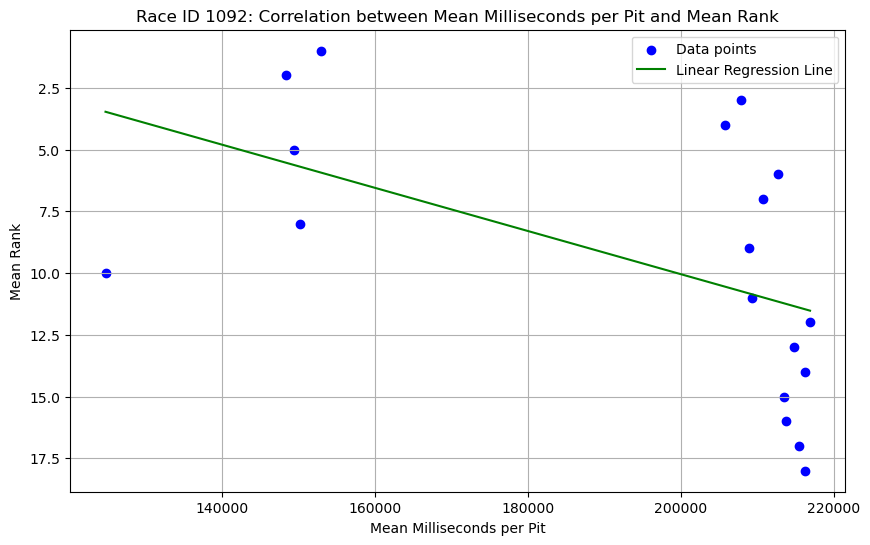

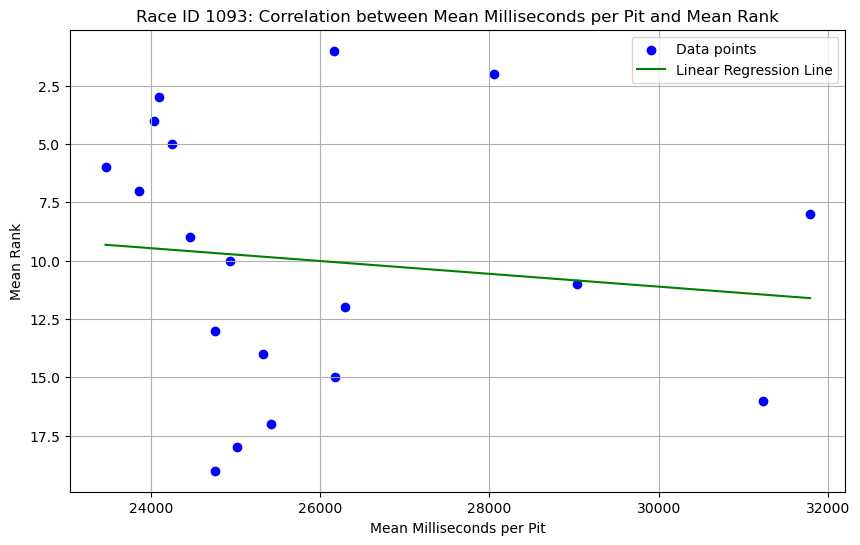

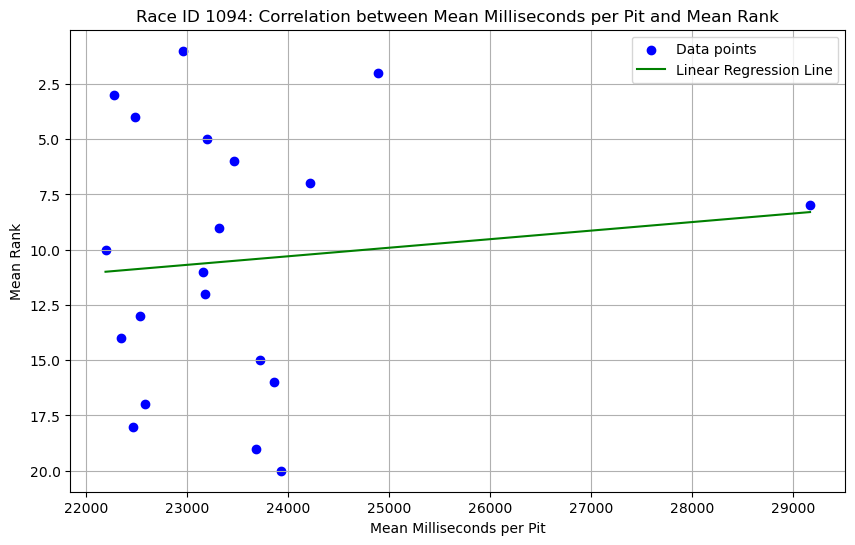

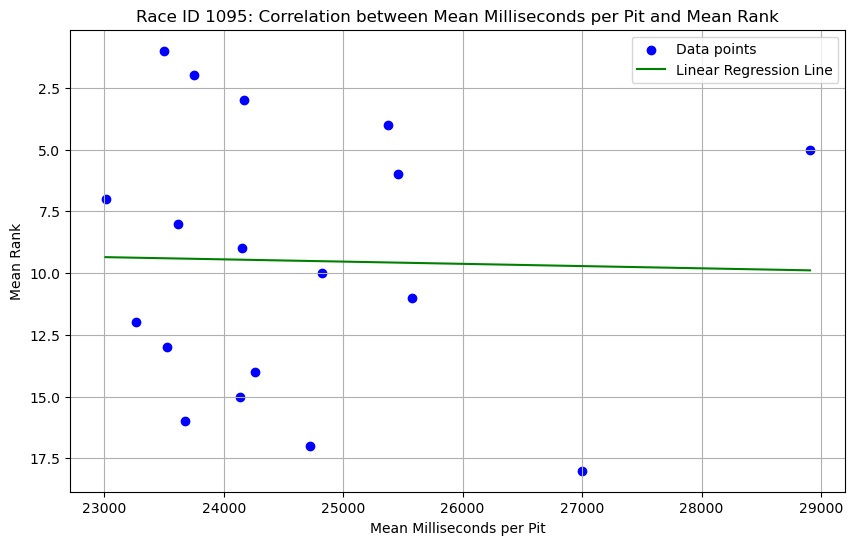

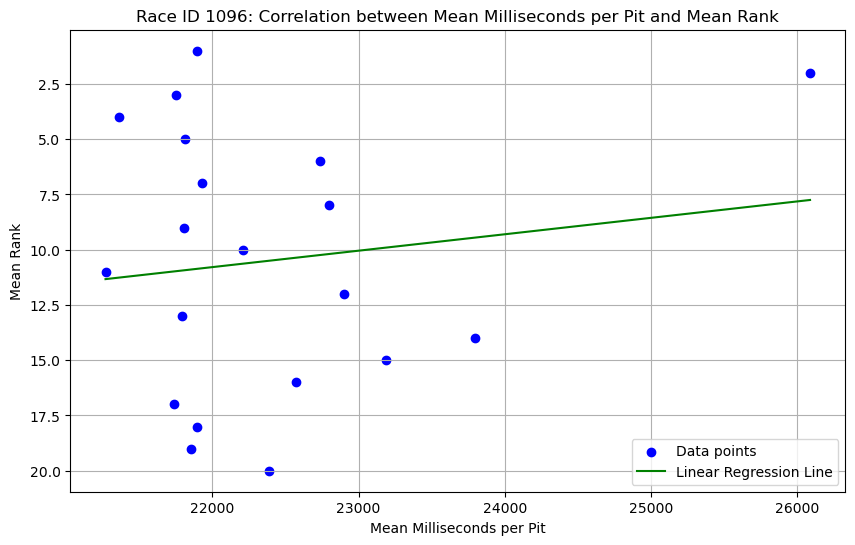

In [26]:
# #cleaning code
# merge['rank'] = pd.to_numeric(merge['rank'], errors='coerce')
# merge['milliseconds_y'] = pd.to_numeric(merge['milliseconds_y'], errors='coerce')
# merge_cleaned = merge[['driverId', 'milliseconds_y', 'rank']]
# merge_cleaned = merge_cleaned.replace(r'\\N', pd.NA, regex=True)
# merge_cleaned = merge_cleaned.dropna(axis=0, how='any')
# merge_cleaned = merge_cleaned[merge_cleaned["rank"] != 0]
# grouped = (merge_cleaned.groupby("driverId")
#            .agg(mean_milliseconds_pit=("milliseconds_y", "mean"),
#                 mean_rank=("rank", "mean"))
#                 .reset_index()
#                 .sort_values(by="mean_rank", ascending=True))
# grouped

# plt.scatter(x=grouped["mean_milliseconds_pit"], y=grouped["mean_rank"])
# plt.plot(grouped['mean_milliseconds_pit'],grouped['mean_rank'],color="green")
# plt.show()

#Cleaning code
merge['rank'] = pd.to_numeric(merge['rank'], errors='coerce')
merge['milliseconds_y'] = pd.to_numeric(merge['milliseconds_y'], errors='coerce')
merge_cleaned = merge[['driverId', 'milliseconds_y', 'rank']]
merge_cleaned = merge_cleaned.replace(r'\\N', pd.NA, regex=True)
merge_cleaned = merge_cleaned.dropna(axis=0, how='any')
merge_cleaned = merge_cleaned[merge_cleaned["rank"] != 0]

# Grouping and calculating mean
grouped = (merge_cleaned.groupby("driverId")
           .agg(mean_milliseconds_pit=("milliseconds_y", "mean"),
                mean_rank=("rank", "mean"))
           .reset_index()
           .sort_values(by="mean_rank", ascending=False))  # Sort by mean_rank in descending order

grouped


"""
**
This code plots the average driverID time, averaged across all races (raceID)
**
"""
# Plotting the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(grouped["mean_milliseconds_pit"], grouped["mean_rank"], color='blue', label='Data points')

# Calculating and plotting the linear regression line
slope, intercept = np.polyfit(grouped["mean_milliseconds_pit"], grouped["mean_rank"], 1)
x = np.array([grouped["mean_milliseconds_pit"].min(), grouped["mean_milliseconds_pit"].max()])
y = slope * x + intercept
plt.plot(x, y, color='green', label='Linear Regression Line')

# Additional plot settings
plt.gca().invert_yaxis()  # Optional: invert y-axis so higher ranks appear at the top
plt.title('Correlation between Mean Milliseconds per Pit and Mean Rank')
plt.xlabel('Mean Milliseconds per Pit')
plt.ylabel('Mean Rank')
plt.legend()
plt.grid(True)
plt.show()



describe main columns

In [27]:
#describe main columns code
